# Profiling DNA Shape in Promoters, Genome-Wide

## Import Packages and Load Data

In [1]:
import os
from pathlib import Path
import sys

from Bio.SeqFeature import FeatureLocation
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

sys.path.append('../bitome-kb')
from bitome.core import Bitome

In [2]:
bitome = Bitome.init_from_file('bitome.pkl')

## Extract known TSS and strand information

In [3]:
tss_strand_tups = []
for tu in bitome.transcription_units:
    tu_strand = tu.location.strand
    if tu_strand == 1:
        # make sure to 1-index this position
        tu_tss = tu.location.start.position + 1
    else:
        tu_tss = tu.location.end.position
    tss_strand_tups.append((tu_tss, tu_strand))
    
unique_tss_strand_tups = list(set(tss_strand_tups))

## Compute shape at each nucleotide N bp upstream of TSS

Also compute AT density in 11 bp windows (+/-5 for each bp) as moving average

In [7]:
N_UPSTREAM = 200
N_DOWNSTREAM = 100
AT_PLUS_MINUS = 5

shape_names = ['MGW', 'ProT', 'HelT', 'ORChLD', 'Roll']
upstream_shape_df = pd.DataFrame(columns=(shape_names + ['bp', 'AT']))

for tss, strand in unique_tss_strand_tups[:2]:

    if strand == 1:
        
        # ignore the case where we have to wrap around for now; just excludes a couple of TSS
        if tss < N_UPSTREAM:
            continue
        
        locs = np.arange(tss - N_UPSTREAM, tss + N_DOWNSTREAM + 1)
        bp_to_tss = np.arange(-N_UPSTREAM, N_DOWNSTREAM + 1)
        
        # define the sequence feature location to extract the sequence around this TSS
        seq_loc = FeatureLocation(
            tss - N_UPSTREAM - AT_PLUS_MINUS - 1,
            tss + N_DOWNSTREAM + AT_PLUS_MINUS,
            strand
        )
        
    else:

        locs = np.arange(tss - N_DOWNSTREAM, tss + N_UPSTREAM + 1)
        bp_to_tss = np.flip(np.arange(-N_UPSTREAM, N_DOWNSTREAM + 1))

        # define the sequence feature location to extract the sequence around this TSS
        seq_loc = FeatureLocation(
            tss - N_DOWNSTREAM - AT_PLUS_MINUS - 1,
            tss + N_UPSTREAM + AT_PLUS_MINUS,
            strand
        )
    
    tss_shape_df = bitome.get_shape((locs[0], locs[-1]))
    tss_shape_df['bp'] = bp_to_tss
    
    sequence = seq_loc.extract(bitome.sequence)
    at_content = []
    for i in range(AT_PLUS_MINUS, N_UPSTREAM + N_DOWNSTREAM + AT_PLUS_MINUS + 1):
        seq_slice = sequence[i-AT_PLUS_MINUS:i+AT_PLUS_MINUS+1]
        at_count = 0
        for base in seq_slice:
            if base in ['A', 'T']:
                at_count += 1
        at_content.append(at_count/(2*AT_PLUS_MINUS + 1))
    
    # we computed AT content in sequence order, REGARDLESS of strand; but we're feeding
    # the bp in reverse order for the reverse strand; swap the AT content list in that case
    if strand == -1:
        at_content.reverse()
    
    tss_shape_df['AT'] = at_content
    
    upstream_shape_df = upstream_shape_df.append(tss_shape_df)

/Users/cam/.virtualenvs/strainware-s/lib/python3.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/cam/.virtualenvs/strainware-s/lib/python3.7/site-packages/ipykernel_launcher.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [7]:
# take the absolute value of Roll
upstream_shape_df.loc[:, 'Roll'] = upstream_shape_df['Roll'].abs()

## Compute AT/Shape Correlations

In [8]:
avg_df_idx = np.arange(-N_UPSTREAM, N_DOWNSTREAM + 1)
shape_avg_df = pd.DataFrame(index=avg_df_idx, columns=['AT'] + shape_names)
for bp in avg_df_idx:
    bp_shape_df = upstream_shape_df[upstream_shape_df['bp'] == bp]
    bp_avg = bp_shape_df.drop(columns='bp').mean(axis=0)
    shape_avg_df.loc[bp, :] = bp_avg

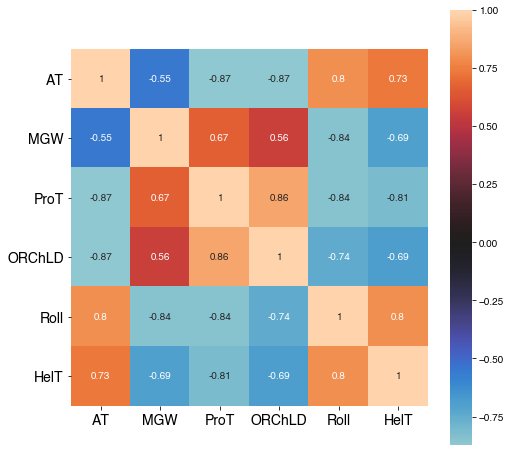

In [9]:
shape_avg_df = shape_avg_df.astype(float)
corr_df = shape_avg_df.corr(method='spearman')

_, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(corr_df, center=0, annot=True, square=True, ax=ax)
ax.tick_params(axis='both', labelsize=14)
ax.tick_params(axis='y', rotation=0)

## Boostrap Random TSS/Strand Tuples and Do the Same Calculations

In [10]:
N_BOOTSTRAP = len(unique_tss_strand_tups)

random_tss_strand_tups = []
buffer = max(N_UPSTREAM, N_DOWNSTREAM)
tss_pool = np.arange(buffer, len(bitome.sequence) - buffer)
for i in range(N_BOOTSTRAP):
    tss = int(np.random.choice(tss_pool))
    strand = int(np.random.choice([-1, 1]))
    random_tss_strand_tups.append((tss, strand))

random_shape_df = pd.DataFrame(columns=(shape_names + ['bp', 'AT']))

for tss, strand in random_tss_strand_tups:

    if strand == 1:
        
        # ignore the case where we have to wrap around for now; just excludes a couple of TSS
        if tss < N_UPSTREAM:
            continue
        
        locs = np.arange(tss - N_UPSTREAM, tss + N_DOWNSTREAM + 1)
        bp_to_tss = np.arange(-N_UPSTREAM, N_DOWNSTREAM + 1)
        
        # define the sequence feature location to extract the sequence around this TSS
        seq_loc = FeatureLocation(
            tss - N_UPSTREAM - AT_PLUS_MINUS - 1,
            tss + N_DOWNSTREAM + AT_PLUS_MINUS,
            strand
        )
        
    else:

        locs = np.arange(tss - N_DOWNSTREAM, tss + N_UPSTREAM + 1)
        bp_to_tss = np.flip(np.arange(-N_UPSTREAM, N_DOWNSTREAM + 1))

        # define the sequence feature location to extract the sequence around this TSS
        seq_loc = FeatureLocation(
            tss - N_DOWNSTREAM - AT_PLUS_MINUS - 1,
            tss + N_UPSTREAM + AT_PLUS_MINUS,
            strand
        )
    
    tss_shape_df = pd.DataFrame(columns=shape_names)
    for shape_series in shape_series_list:
        tss_shape_df[shape_series.name] = shape_series[locs]
    tss_shape_df['bp'] = bp_to_tss
    
    sequence = seq_loc.extract(bitome.sequence)
    at_content = []
    for i in range(AT_PLUS_MINUS, N_UPSTREAM + N_DOWNSTREAM + AT_PLUS_MINUS + 1):
        seq_slice = sequence[i-AT_PLUS_MINUS:i+AT_PLUS_MINUS+1]
        at_count = 0
        for base in seq_slice:
            if base in ['A', 'T']:
                at_count += 1
        at_content.append(at_count/(2*AT_PLUS_MINUS + 1))
    
    # we computed AT content in sequence order, REGARDLESS of strand; but we're feeding
    # the bp in reverse order for the reverse strand; swap the AT content list in that case
    if strand == -1:
        at_content.reverse()
    
    tss_shape_df['AT'] = at_content
    
    random_shape_df = random_shape_df.append(tss_shape_df)

In [11]:
# take the absolute value of Roll
random_shape_df.loc[:, 'Roll'] = random_shape_df['Roll'].abs()

In [12]:
random_shape_avg_df = pd.DataFrame(index=avg_df_idx, columns=['AT'] + shape_names)
for bp in avg_df_idx:
    bp_shape_df = random_shape_df[random_shape_df['bp'] == bp]
    bp_avg = bp_shape_df.drop(columns='bp').mean(axis=0)
    random_shape_avg_df.loc[bp, :] = bp_avg

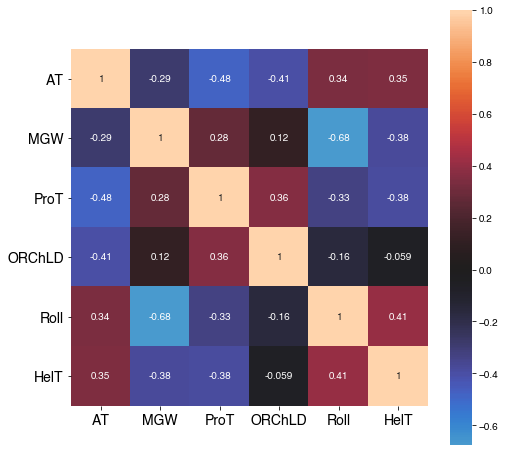

In [13]:
random_shape_avg_df = random_shape_avg_df.astype(float)
random_corr_df = random_shape_avg_df.corr(method='spearman')

_, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(random_corr_df, center=0, annot=True, square=True, ax=ax)
ax.tick_params(axis='both', labelsize=14)
ax.tick_params(axis='y', rotation=0)

## Plot the Shape Values for TSS (and Random Sequences)

Text(0.5, 0, 'bp from TSS')

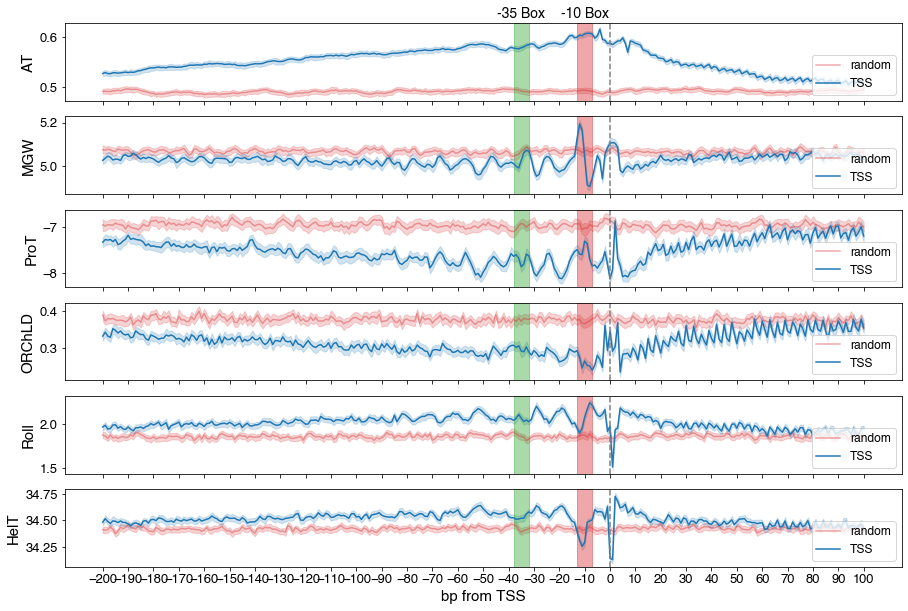

In [15]:
_, axs = plt.subplots(6, 1, figsize=(15, 10), sharex=True)

for ax, shape_name in zip(axs, ['AT'] + shape_names):

    sns.lineplot(x='bp', y=shape_name, data=random_shape_df, estimator='mean', ax=ax, n_boot=100,
                 color='tab:red', alpha=0.4, label='random')
    sns.lineplot(x='bp', y=shape_name, data=upstream_shape_df, estimator='mean', ax=ax, n_boot=100, label='TSS')
    ax.set_ylabel(shape_name, fontsize=15)
    ax.tick_params(axis='both', labelsize=13)
    ax.set_xticks(np.arange(-N_UPSTREAM, N_DOWNSTREAM + 10, 10))
    ax.axvline(0, linestyle='--', color='gray')
    ymin, ymax = ax.get_ylim()
    ax.add_patch(Rectangle((-13, ymin), 6, (ymax-ymin), color='tab:red', alpha=0.4))
    ax.add_patch(Rectangle((-38, ymin), 6, (ymax-ymin), color='tab:green', alpha=0.4))
    ax.legend(loc='lower right', fontsize=12)

ax0_ymin, ax0_ymax = axs[0].get_ylim()
axs[0].text(-10, ax0_ymax+(ax0_ymax-ax0_ymin)*0.07, '-10 Box', fontsize=14, ha='center')
axs[0].text(-35, ax0_ymax+(ax0_ymax-ax0_ymin)*0.07, '-35 Box', fontsize=14, ha='center')    
axs[-1].set_xlabel('bp from TSS', fontsize=15)

## Plot overall distribution of these features for every base in genome

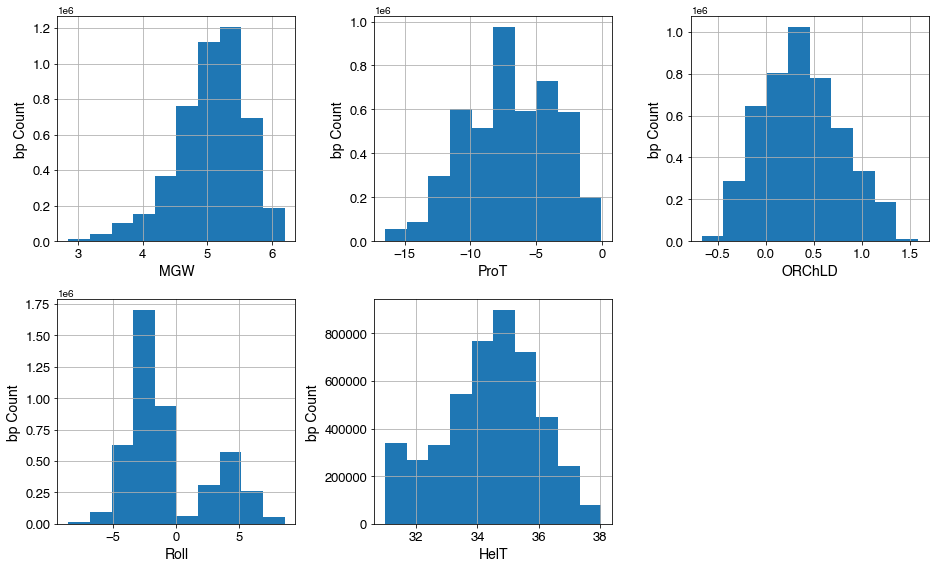

In [75]:
_, axs = plt.subplots(2, 3, figsize=(13, 8))
axs = axs.flatten()

for ax, shape_series in zip(axs, shape_series_list):
    shape_series.hist(ax=ax)
    ax.tick_params(axis='both', labelsize=13)
    ax.set_xlabel(shape_series.name, fontsize=14)
    ax.set_ylabel('bp Count', fontsize=14)
    
axs[-1].set_visible(False)

plt.tight_layout()

## Plot Shape Values in TFBS Regions

In [98]:
tfbs_loc = []
for tfbs in bitome.tf_binding_sites:
    tfbs_loc += list(np.arange(tfbs.location.start.position + 1, tfbs.location.end.position + 1))
tfbs_loc = set(tfbs_loc)
non_tfbs_loc = set(np.arange(3, len(bitome.sequence)-1)) - tfbs_loc
tfbs_loc = list(tfbs_loc)
non_tfbs_loc = list(non_tfbs_loc)

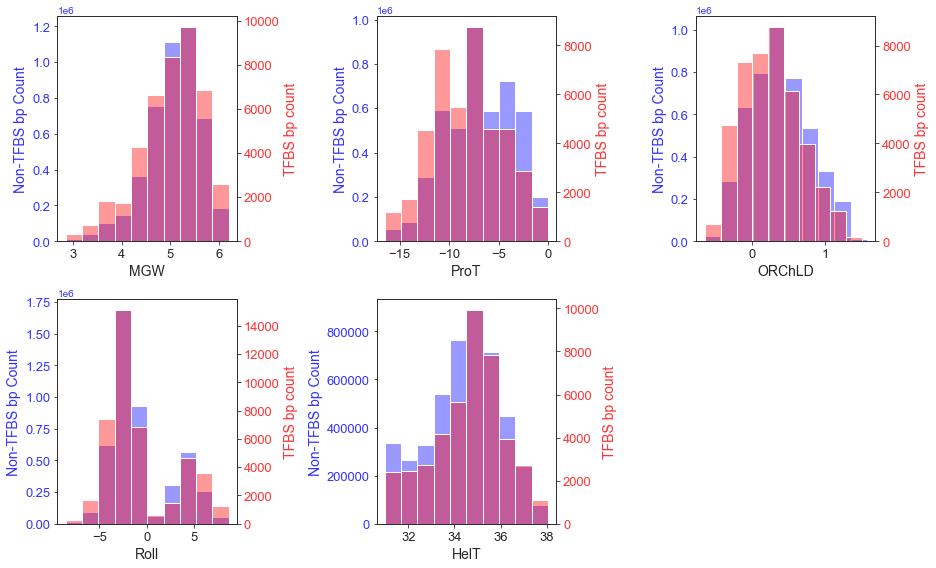

In [107]:
_, axs = plt.subplots(2, 3, figsize=(13, 8))
axs = axs.flatten()

for ax, shape_series in zip(axs, shape_series_list):
    shape_series[non_tfbs_loc].hist(ax=ax, color=(0, 0, 1, 0.4), label='Non TFBS')
    ax2 = ax.twinx()
    shape_series[tfbs_loc].hist(ax=ax2, color=(1, 0, 0, 0.4), label='TFBS')
    ax.tick_params(axis='both', labelsize=13)
    ax.tick_params(axis='y', labelcolor=(0, 0, 1, 0.8))
    ax2.tick_params(axis='both', labelsize=13)
    ax2.tick_params(axis='y', labelcolor=(1, 0, 0, 0.8))
    ax.set_xlabel(shape_series.name, fontsize=14)
    ax.set_ylabel('Non-TFBS bp Count', fontsize=14, color=(0, 0, 1, 0.8))
    ax2.set_ylabel('TFBS bp count', fontsize=14, color=(1, 0, 0, 0.8))
    ax.grid(False)
    ax2.grid(False)
    
axs[-1].set_visible(False)

plt.tight_layout()

## Plot Aligned Shape Values in TFBS

In [9]:
def rpwm(fname):
    logodds = {}
    ffile = open(fname, "rt")
    lines = ffile.readlines()
    ffile.close()
    
    for line in lines:
        sline = line.strip()
        if sline[0] == '>':
            name = sline.split()[0][1:]
            size = int(sline.split()[1])
            logodds[name] = [ {'A':0,'C':0,'G':0,'T':0} for i in range(size)]
        else:
            slist = sline.split()
            letter = slist[0]
            vlist = slist[1:]
            for i in range(size):
                logodds[name][i][letter] = float(vlist[i])
            
    return logodds

In [10]:
pwm = rpwm('data/motif_pwm_db.txt')
pwm.keys()

dict_keys(['AraC', 'ArcA', 'ArgR', 'CysB', 'CpxR', 'Cra', 'Crp', 'Mlc', 'EvgA', 'ExuR', 'FadR', 'IclR', 'FlhDC', 'Fnr', 'Fur', 'GcvA', 'GlpR', 'GntR', 'TyrR', 'Lrp', 'MalT', 'MetJ', 'Nac', 'NagC', 'NarL', 'NtrC', 'OxyR', 'PurR', 'PuuR', 'RcsAB', 'SoxS', 'TrpR', 'XylR'])

In [13]:
TF = {}
for k in pwm.keys():
    for tf in bitome.transcription_factors:
        if tf.name == k:
            TF[k] = tf

### Get the Locations of Matched Motifs for Genes in the IModulon AND in the Regulons for Each TF

In [109]:
N_UPSTREAM_TFBS = 50
N_DOWNSTREAM_TFBS = 50

In [125]:
pd.options.mode.chained_assignment = None

from matplotlib import rc
rc('font',**{'family':'serif','serif':['Palatino']})
plt.rcParams['pdf.fonttype'] = 42

/Users/cam/.virtualenvs/strainware-s/lib/python3.7/site-packages/ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/cam/.virtualenvs/strainware-s/lib/python3.7/site-packages/ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/cam/.virtualenvs/strainware-s/lib/python3.7/site-packages/ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too muc

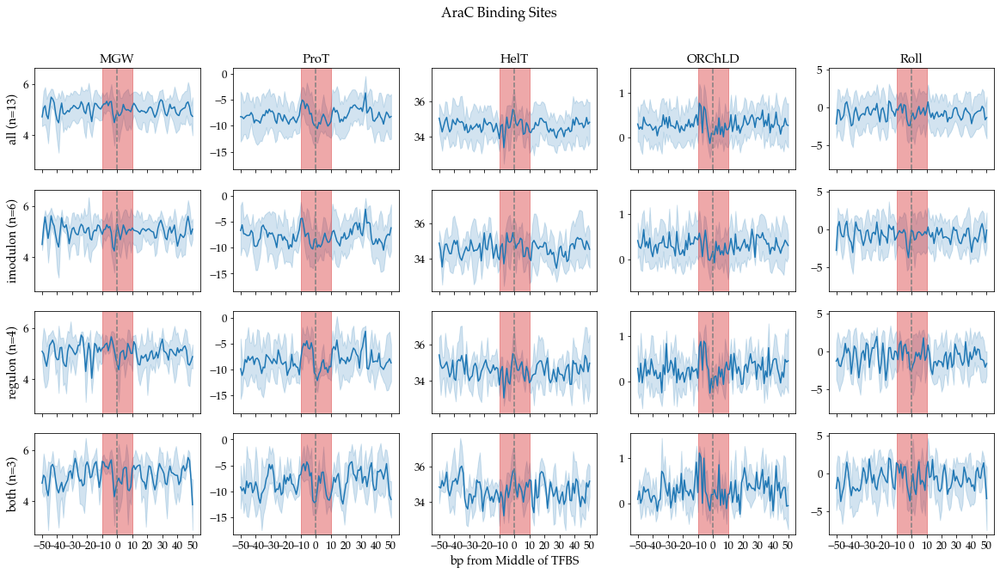

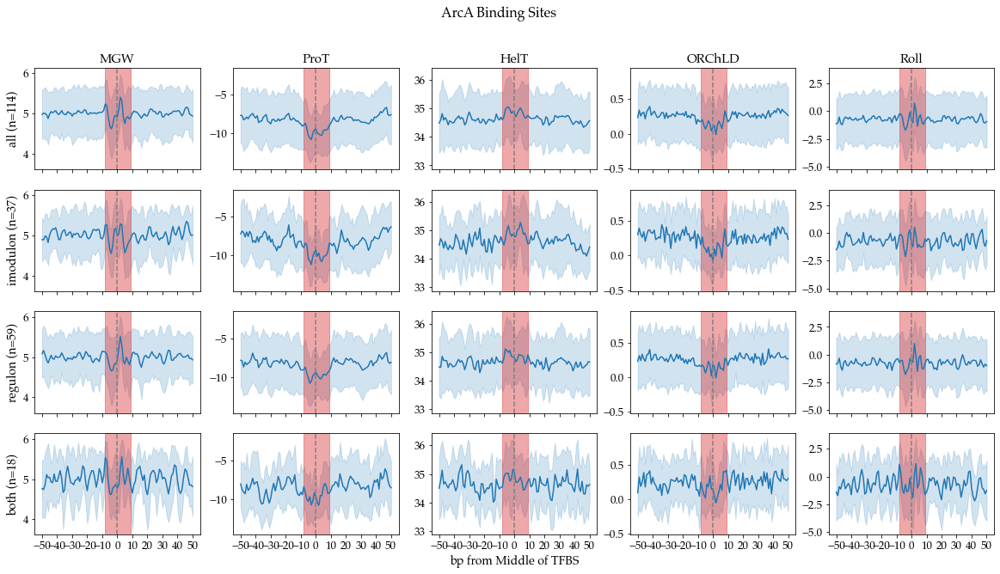

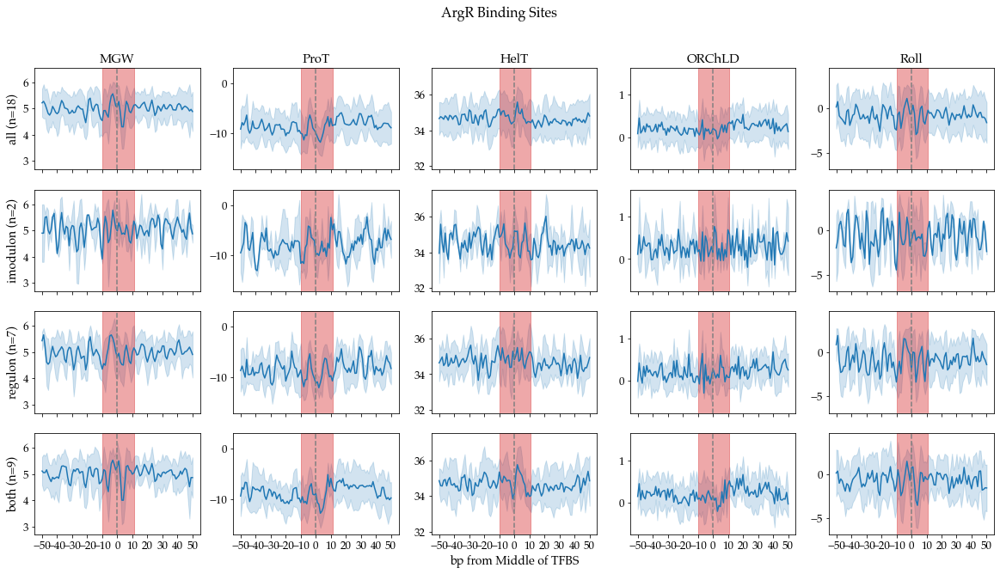

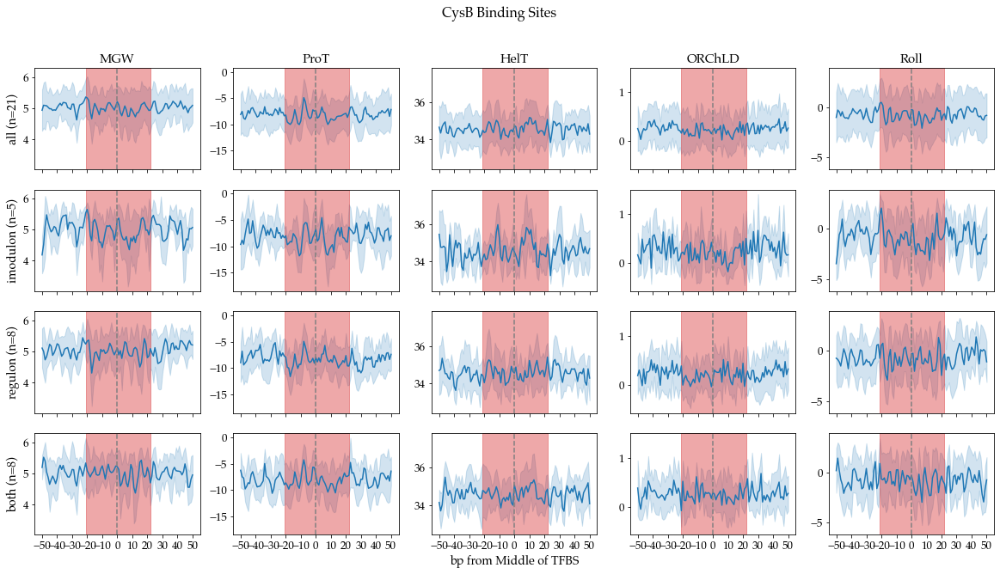

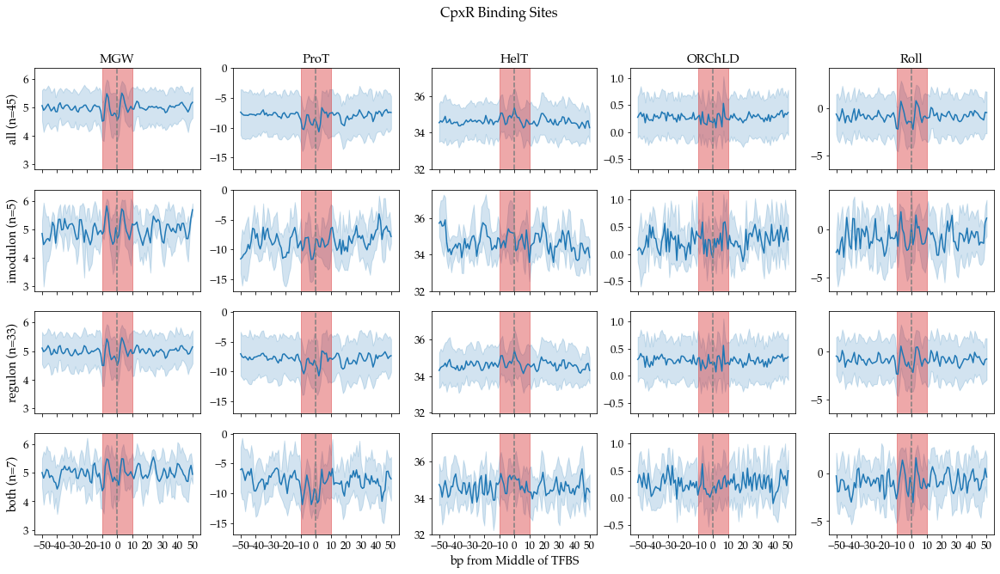

...

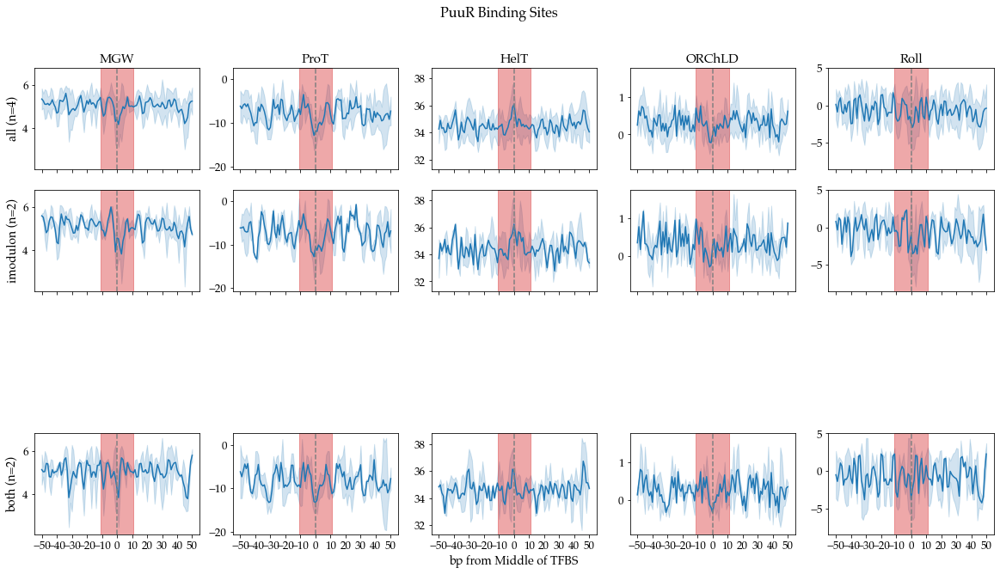

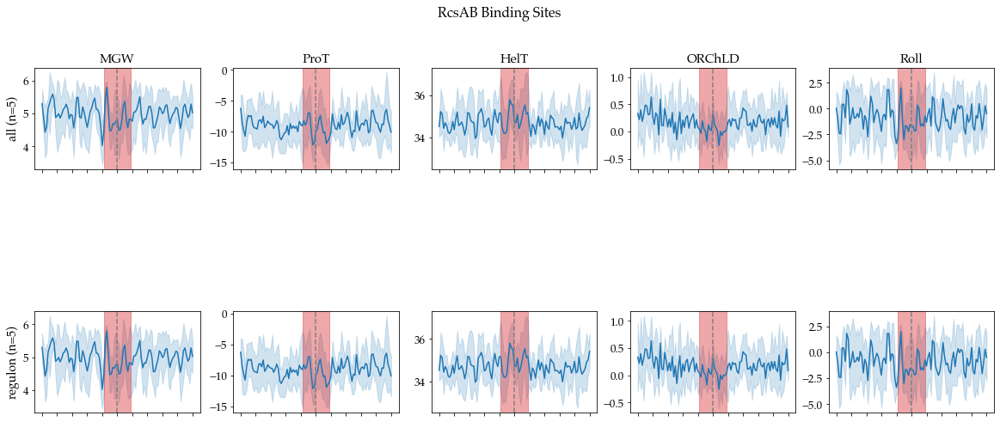

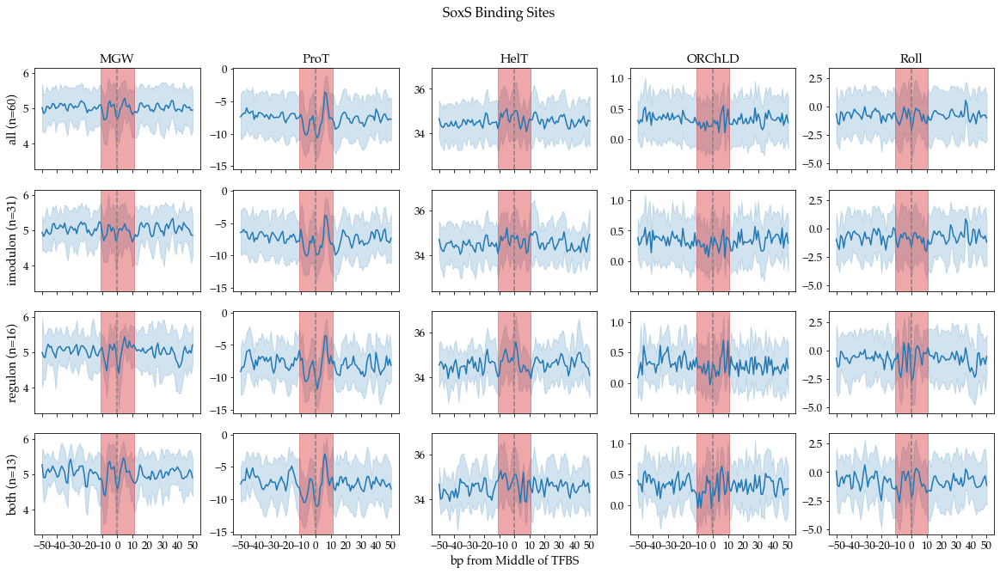

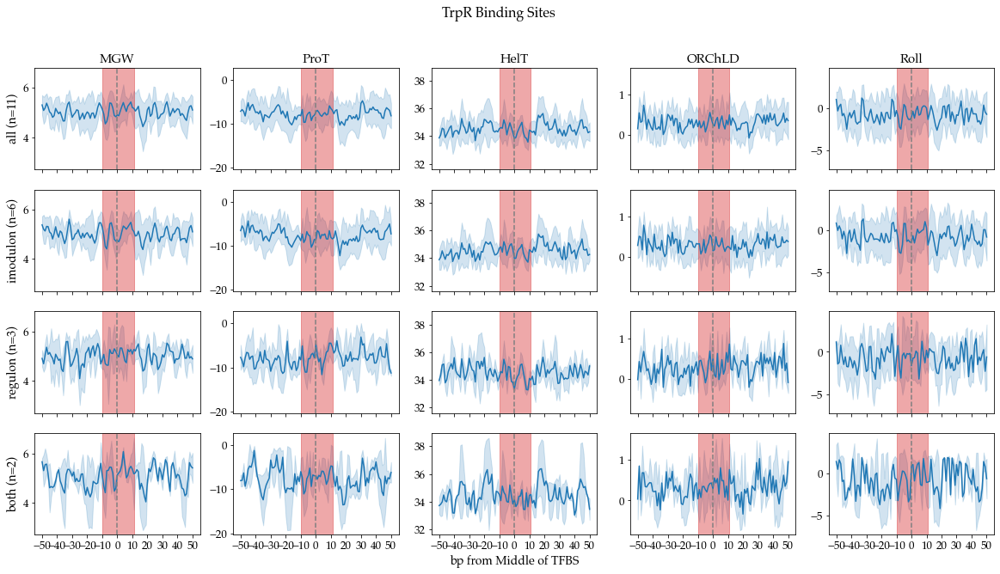

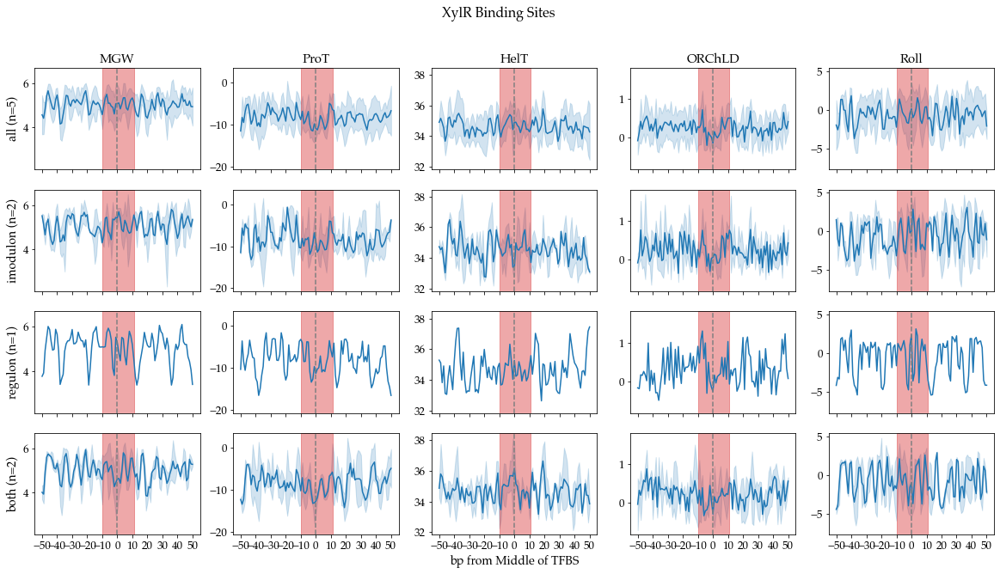

In [129]:
figs = []

for tf_name, tf in list(TF.items()):
    
    # get ALL the imodulon TUs (including from multiple iModulons)
    imod_tus = []
    for tf_imod in tf.i_modulons:
        tf_imod_genes = tf_imod.genes
        for imod_gene in tf_imod_genes:
            for tu in imod_gene.transcription_units:
                if tu.tss is not None:
                    imod_tus.append(tu)
    imod_tus = set(imod_tus)
    
    # get all the TUs regulated by regulons
    regulated_proms = []
    for tf_regulon in tf.regulons:
        for regulon_promoters in tf_regulon.regulated_promoters.values():
            regulated_proms += regulon_promoters
    regulated_proms = list(set(regulated_proms))
    regulon_tus = [prom.transcription_unit for prom in regulated_proms if prom.transcription_unit is not None]
    regulon_tus = set(regulon_tus)
    
    # determine which TUs are in just the regulon, just the imod, or both
    just_imod = imod_tus - regulon_tus
    just_regulon = regulon_tus - imod_tus
    both = imod_tus.intersection(regulon_tus)
    
    # iterate over ALL of these TUs and look for the TF binding site
    all_tf_tus = imod_tus.union(regulon_tus)
    tfbs_shape_df = pd.DataFrame()
    
    member_lens = {
        member: len(member_set) for member, member_set in
        zip(['all', 'imodulon', 'regulon', 'both'], [all_tf_tus, just_imod, just_regulon, both])
    }
    
    for tu in list(all_tf_tus):

        # find the best motif for this TU
        motif_match_dict = bitome.motif_match(pwm, tu, tf_name)
        dist_to_motif_middle = int(motif_match_dict[f'{tf_name} distToTSS'])
        motif_upstream = int(motif_match_dict[f'{tf_name} upstreamTSS']) == 1
        
        # get its absolute location
        tss = tu.tss
        
        # upstream of tss, and on positive strand
        if motif_upstream and tu.location.strand == 1:
            motif_mid_abs = tss - dist_to_motif_middle
            shape_range = np.arange(motif_mid_abs - N_UPSTREAM_TFBS, motif_mid_abs + N_DOWNSTREAM_TFBS + 1)
            bp_to_tfbs = np.arange(-N_UPSTREAM_TFBS, N_DOWNSTREAM_TFBS + 1)
        elif motif_upstream and tu.location.strand == -1:
            motif_mid_abs = tss + dist_to_motif_middle
            shape_range = np.arange(motif_mid_abs - N_DOWNSTREAM_TFBS, motif_mid_abs + N_UPSTREAM_TFBS + 1)
            bp_to_tfbs = np.flip(np.arange(-N_UPSTREAM_TFBS, N_DOWNSTREAM_TFBS + 1))
        elif not motif_upstream and tu.location.strand == 1:
            motif_mid_abs = tss + dist_to_motif_middle
            shape_range = np.arange(motif_mid_abs - N_UPSTREAM_TFBS, motif_mid_abs + N_DOWNSTREAM_TFBS + 1)
            bp_to_tfbs = np.arange(-N_UPSTREAM_TFBS, N_DOWNSTREAM_TFBS + 1)
        elif not motif_upstream and tu.location.strand == -1:
            motif_mid_abs = tss - dist_to_motif_middle
            shape_range = np.arange(motif_mid_abs - N_DOWNSTREAM_TFBS, motif_mid_abs + N_UPSTREAM_TFBS + 1)
            bp_to_tfbs = np.flip(np.arange(-N_UPSTREAM_TFBS, N_DOWNSTREAM_TFBS + 1))
            
        tu_tfbs_shape_df = bitome.get_shape((shape_range[0], shape_range[-1]))
        tu_tfbs_shape_df.loc[:, 'bp'] = bp_to_tfbs
        
        if tu in just_imod:
            membership = 'imodulon'
        elif tu in just_regulon:
            membership = 'regulon'
        elif tu in both:
            membership = 'both'
        tu_tfbs_shape_df.loc[:, 'member'] = membership
        tfbs_shape_df = tfbs_shape_df.append(tu_tfbs_shape_df, ignore_index=True)
        
    fig, axs = plt.subplots(4, 5, figsize=(20, 10), sharey='col', sharex=True)
    axs = axs.T
    
    for i, (ax_group, shape_name) in enumerate(zip(axs, shape_names)):
        for ax, member in zip(ax_group, ['all', 'imodulon', 'regulon', 'both']):
            if member != 'all':
                data_to_use = tfbs_shape_df[tfbs_shape_df['member'] == member]
            else:
                data_to_use = tfbs_shape_df
            if data_to_use.empty:
                ax.set_visible(False)
            else:
                sns.lineplot(x='bp', y=shape_name, data=data_to_use, estimator='mean', ci='sd', ax=ax, label=member)
                ax.set_ylabel('')
                ax.set_xlabel('')
                ax.tick_params(axis='both', labelsize=13)
                ax.set_xticks(np.arange(-N_UPSTREAM_TFBS, N_DOWNSTREAM_TFBS + 10, 10))
                ax.axvline(0, linestyle='--', color='gray')
                ax.get_legend().remove()
                if i == 0:
                    ax.set_ylabel(f'{member} (n={member_lens[member]})', fontsize=14)
        ax_group[0].set_title(f'{shape_name}', fontsize=15)
        
    for ax in axs.flatten():
        ymin, ymax = ax.get_ylim()
        ax.add_patch(
            Rectangle(
                (-int(len(pwm[tf_name])/2), ymin), len(pwm[tf_name]), (ymax-ymin),
                color='tab:red', alpha=0.4
            )
        )
    axs_flat = axs.flatten()
    axs_flat[11].set_xlabel('bp from Middle of TFBS', fontsize=14)
        
    fig.suptitle(f'{tf_name} Binding Sites', fontsize=16)
    figs.append(fig)

In [130]:
import matplotlib.backends.backend_pdf
pdf = matplotlib.backends.backend_pdf.PdfPages("tfbs_shape_profiles.pdf")
for fig in figs: ## will open an empty extra figure :(
    pdf.savefig(fig)
pdf.close()